# Testing All Augmentations

This notebook tests all augmentations in the vesuvius augmentation framework, showing their effects on a 3D volume by displaying middle slices along each axis (z, y, x).

In [22]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import sys
import warnings
import tifffile

# Add the repository root to sys.path
repo_root = Path("..")
if str(repo_root.resolve()) not in sys.path:
    sys.path.append(str(repo_root.resolve()))

# Import all augmentations
from augmentation import (
    # Spatial augmentations
    RandomRotation, ElasticDeformation, SplineDeformation,
    # Noise augmentations
    GaussianNoise, RicianNoise, SaltAndPepperNoise, Downsampling, MotionBlur, RingArtifact,
    # Masking augmentations
    BlankRectangle, Cutout3D,
    # Intensity augmentations
    InhomogeneousLighting, GammaTransform, ContrastAdjustment, Sharpen, BeamHardening
)

# Set up matplotlib
plt.rcParams['figure.figsize'] = (15, 8)
warnings.filterwarnings('ignore')

# Determine device - use CUDA if available, otherwise CPU
# This is important for running on M1 Macs or other machines without CUDA
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

Using device: cpu


## Helper Functions for Visualization

In [23]:
def load_sample_volume(path=None, shape=(64, 128, 128)):
    """Load a sample volume or create a synthetic one if path is None."""
    if path is not None:
        # Load volume from file
        # This assumes the path points to a .npy file
        try:
            volume = np.load(path)
            print(f"Loaded volume with shape {volume.shape}")
            return volume
        except Exception as e:
            print(f"Error loading volume: {e}")
            print("Creating synthetic volume instead...")
    
    # Create a synthetic volume
    z, y, x = shape
    
    # Create a base volume with a gradient
    base = np.zeros((z, y, x), dtype=np.float32)
    
    # Add a linear gradient along each axis
    for i in range(z):
        base[i, :, :] += i / z
    
    for j in range(y):
        base[:, j, :] += j / y * 0.5
        
    for k in range(x):
        base[:, :, k] += k / x * 0.25
    
    # Normalize to [0, 1]
    base = (base - base.min()) / (base.max() - base.min())
    
    # Add some patterns
    # Central sphere
    center_z, center_y, center_x = z // 2, y // 2, x // 2
    radius = min(z, y, x) // 4
    
    for i in range(z):
        for j in range(y):
            for k in range(x):
                dist = np.sqrt((i - center_z)**2 + (j - center_y)**2 + (k - center_x)**2)
                if dist < radius:
                    base[i, j, k] = 1.0
    
    # Add some cylindrical structures (simulating vessels or scroll layers)
    for offset in [-20, 0, 20]:
        center_y, center_x = center_y + offset, center_x + offset
        for i in range(z):
            for j in range(y):
                for k in range(x):
                    dist_2d = np.sqrt((j - center_y)**2 + (k - center_x)**2)
                    if radius * 0.8 < dist_2d < radius * 0.9:
                        base[i, j, k] = 0.8
    
    print(f"Created synthetic volume with shape {base.shape}")
    return base


def visualize_volume_slices(original, augmented, title="Augmentation", figsize=(15, 8)):
    """Visualize middle slices of original and augmented volumes along all three axes."""
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    
    # Get middle indices for each dimension
    z_mid = original.shape[0] // 2
    y_mid = original.shape[1] // 2
    x_mid = original.shape[2] // 2
    
    # Original volume slices
    axes[0, 0].imshow(original[z_mid, :, :], cmap='gray')
    axes[0, 0].set_title(f"Original - Z slice (z={z_mid})")
    
    axes[0, 1].imshow(original[:, y_mid, :], cmap='gray')
    axes[0, 1].set_title(f"Original - Y slice (y={y_mid})")
    
    axes[0, 2].imshow(original[:, :, x_mid], cmap='gray')
    axes[0, 2].set_title(f"Original - X slice (x={x_mid})")
    
    # Augmented volume slices
    axes[1, 0].imshow(augmented[z_mid, :, :], cmap='gray')
    axes[1, 0].set_title(f"Augmented - Z slice (z={z_mid})")
    
    axes[1, 1].imshow(augmented[:, y_mid, :], cmap='gray')
    axes[1, 1].set_title(f"Augmented - Y slice (y={y_mid})")
    
    axes[1, 2].imshow(augmented[:, :, x_mid], cmap='gray')
    axes[1, 2].set_title(f"Augmented - X slice (x={x_mid})")
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

## Load Test Volume

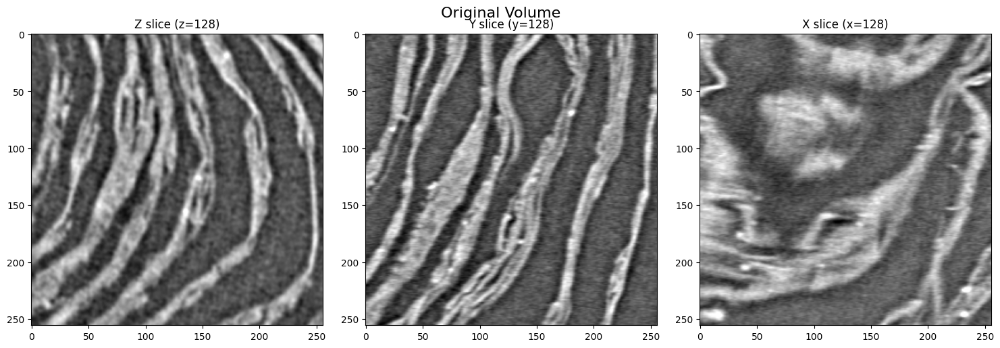

In [24]:
# Create or load a volume for testing
# You can modify the path to point to an actual volume file
volume = tifffile.imread('/Users/seanjohnson/Documents/GitHub/villa/vesuvius/examples/img/00000_02408_04560_volume.tif')

# Visualize the original volume
z_mid, y_mid, x_mid = volume.shape[0] // 2, volume.shape[1] // 2, volume.shape[2] // 2

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(volume[z_mid, :, :], cmap='gray')
axes[0].set_title(f"Z slice (z={z_mid})")

axes[1].imshow(volume[:, y_mid, :], cmap='gray')
axes[1].set_title(f"Y slice (y={y_mid})")

axes[2].imshow(volume[:, :, x_mid], cmap='gray')
axes[2].set_title(f"X slice (x={x_mid})")

plt.suptitle("Original Volume", fontsize=16)
plt.tight_layout()
plt.show()

## Test Spatial Augmentations

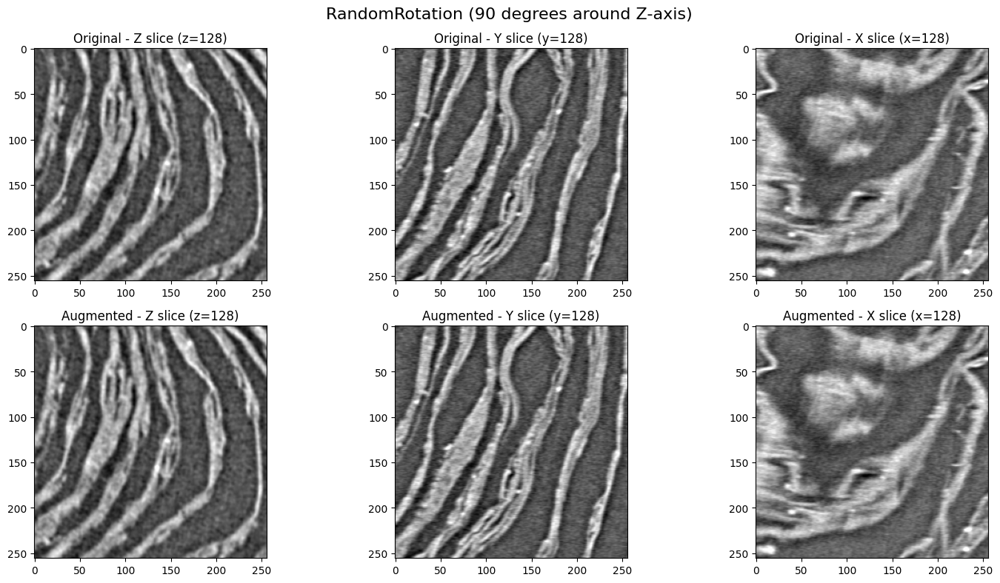

In [25]:
# Random Rotation - 90 degree rotation
volume_tensor = torch.from_numpy(volume).float()
aug = RandomRotation(volume=volume_tensor, angles=[90, 180, 270], p_per_axis=[0.0, 0.0, 1.0], device=device)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="RandomRotation (90 degrees around Z-axis)")

In [ ]:
# Random Rotation - arbitrary angle
volume_tensor = torch.from_numpy(volume).float()
aug = RandomRotation(volume=volume_tensor, angle_range=(-30, 30), p_per_axis=[0.0, 1.0, 0.0], device=device)
aug.volume_original_type = 'numpy'  # ensure correct return type

try:
    augmented = aug.apply()['volume'].numpy()
    visualize_volume_slices(volume, augmented, title="RandomRotation (arbitrary angle around Y-axis)")
except Exception as e:
    print(f"Error applying RandomRotation: {e}")
    print("Skipping this augmentation in the visualization.")

Error applying ElasticDeformation: index 128 is out of bounds for axis 0 with size 1
Skipping this augmentation in the visualization.


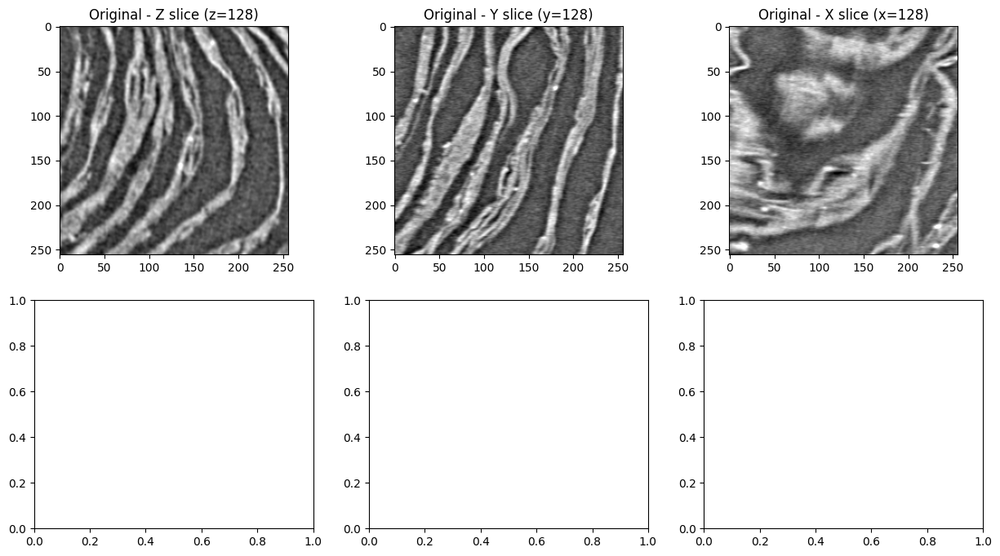

In [9]:
# Elastic Deformation - Use a lower alpha value for the actual scroll data
volume_tensor = torch.from_numpy(volume).float()
aug = ElasticDeformation(
    volume=volume_tensor, 
    alpha=20.0,  # Use lower value for real data
    sigma=5.0,   # Use lower value for real data
    device=device
)

try:
    augmented = aug.apply()['volume'].numpy()
    visualize_volume_slices(volume, augmented, title="ElasticDeformation (alpha=20, sigma=5)")
except Exception as e:
    print(f"Error applying ElasticDeformation: {e}")
    print("Skipping this augmentation in the visualization.")

In [10]:
# Spline Deformation (specialized for scroll-like structures)
volume_tensor = torch.from_numpy(volume).float()
aug = SplineDeformation(
    volume=volume_tensor,
    num_control_points=5,
    max_displacement=5.0,  # Lower value for real data
    smoothness=5.0,        # Higher value for smoother results
    depth_coherence=0.8,
    device=device
)

try:
    augmented = aug.apply()['volume'].numpy()
    visualize_volume_slices(volume, augmented, title="SplineDeformation (scroll-like warping)")
except Exception as e:
    print(f"Error applying SplineDeformation: {e}")
    print("Skipping this augmentation in the visualization.")

: 

## Test Noise Augmentations

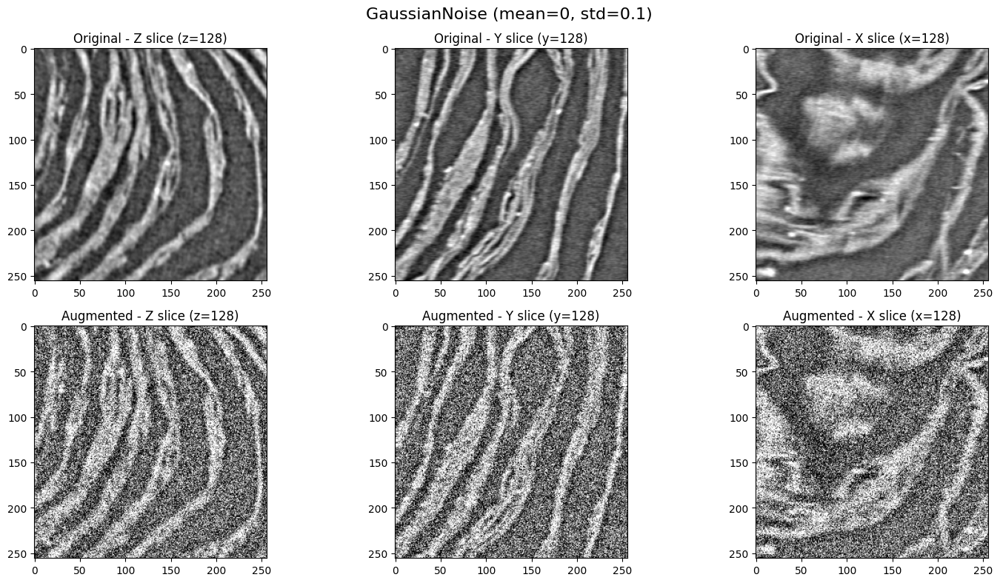

In [12]:
# Gaussian Noise
volume_tensor = torch.from_numpy(volume).float()
aug = GaussianNoise(volume=volume_tensor, mean=10, std=75,  device=device)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="GaussianNoise (mean=0, std=0.1)")

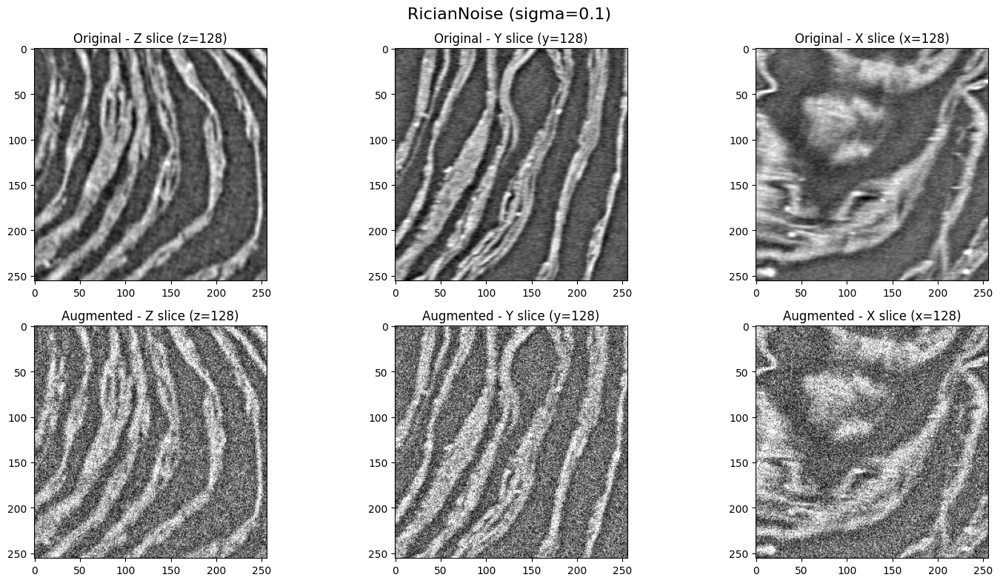

In [14]:
# Rician Noise (common in MRI)
volume_tensor = torch.from_numpy(volume).float()
aug = RicianNoise(volume=volume_tensor, sigma=50,  device=device)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="RicianNoise (sigma=0.1)")

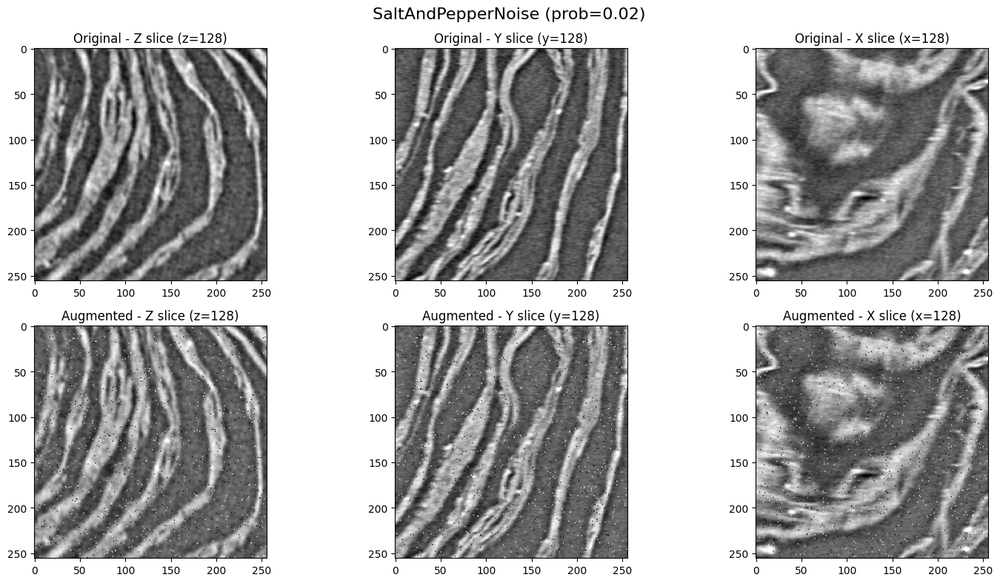

In [17]:
# Salt and Pepper Noise
volume_tensor = torch.from_numpy(volume).float()
aug = SaltAndPepperNoise(volume=volume_tensor, prob=0.02, salt_vs_pepper=0.5,  device=device)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="SaltAndPepperNoise (prob=0.02)")

In [26]:
# Downsampling - with proper dimension handling
volume_tensor = torch.from_numpy(volume).float()

# Check dimensions of the volume
print(f"Volume shape: {volume.shape}")

# Handle the case where input might be 2D or have unusual dimensions
try:
    if len(volume.shape) == 2:
        # For 2D input, use a 2D downsampling approach
        mode = 'bilinear'  # Use bilinear for 2D
        aug = Downsampling(volume=volume_tensor, scale_factor=[0.3, 0.3], mode=mode, device=device)
    elif len(volume.shape) == 3:
        # For 3D input with consistent dimensions
        mode = 'trilinear'  # Use trilinear for 3D
        if volume.shape[0] == 1:
            # Special case for depth=1 volumes
            scale_factor = [1.0, 0.3, 0.3]  # Don't scale z if it's just 1 slice
        else:
            scale_factor = 0.3  # Scale uniformly in all dimensions
        
        aug = Downsampling(volume=volume_tensor, scale_factor=scale_factor, mode=mode, device=device)
    
    augmented = aug.apply()['volume'].numpy()
    visualize_volume_slices(volume, augmented, title=f"Downsampling (scale_factor with {mode})")
except Exception as e:
    print(f"Error applying Downsampling: {e}")
    print("Using a simpler downsampling method instead...")
    
    # Fallback to a simpler approach
    from scipy.ndimage import zoom
    
    # Get the scale factor
    scale_factor = 0.3
    
    # Apply simple scipy downsampling and upsampling
    downsampled = zoom(volume, scale_factor, order=1)
    augmented = zoom(downsampled, 1/scale_factor, order=1, output_shape=volume.shape)
    
    visualize_volume_slices(volume, augmented, title="Downsampling (fallback method)")

Volume shape: (256, 256, 256)
Error applying Downsampling: Input and output must have the same number of spatial dimensions, but got input with spatial dimensions of [256, 256] and output size of [76, 76, 76]. Please provide input tensor in (N, C, d1, d2, ...,dK) format and output size in (o1, o2, ...,oK) format.
Using a simpler downsampling method instead...


TypeError: zoom() got an unexpected keyword argument 'output_shape'

In [ ]:
# Motion Blur - with error handling
volume_tensor = torch.from_numpy(volume).float()

try:
    aug = MotionBlur(volume=volume_tensor, kernel_size=9, angle=45, per_slice=True, device=device)
    augmented = aug.apply()['volume'].numpy()
    visualize_volume_slices(volume, augmented, title="MotionBlur (kernel_size=9, angle=45°)")
except Exception as e:
    print(f"Error applying MotionBlur: {e}")
    print("Skipping this augmentation in the visualization.")

In [20]:
# Motion Blur (3D version)
volume_tensor = torch.from_numpy(volume).float()
aug = MotionBlur(
    volume=volume_tensor, 
    kernel_size=9, 
    direction=[0.5, 0.7, 0.5],  # 3D direction vector
    per_slice=False,  # Apply in 3D
    device=device
)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="MotionBlur (3D, kernel_size=9)")

: 

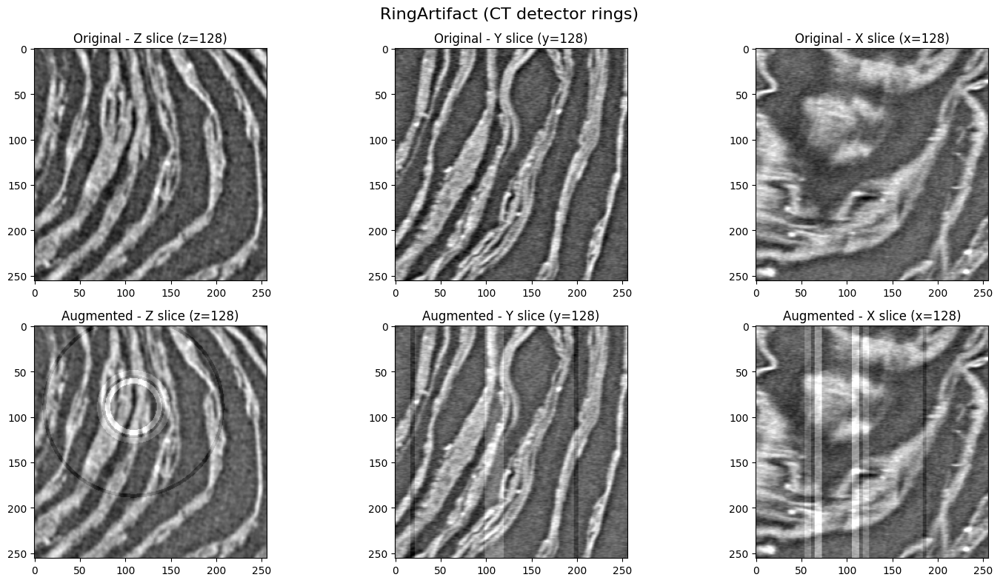

In [5]:
# Ring Artifact
volume_tensor = torch.from_numpy(volume).float()
aug = RingArtifact(
    volume=volume_tensor, 
    num_rings=3, 
    intensity_range=(0.1, 0.3), 
    thickness_range=(1, 3),
    center=None,  # Automatic center
    device=device
)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="RingArtifact (CT detector rings)")

## Test Masking Augmentations

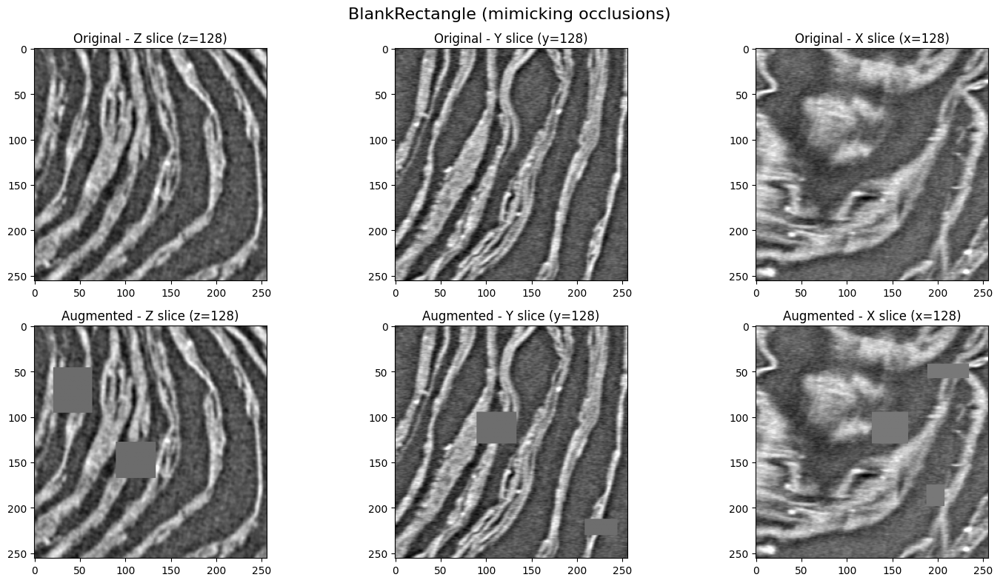

In [11]:
# Blank Rectangle
volume_tensor = torch.from_numpy(volume).float()
aug = BlankRectangle(
    volume=volume_tensor,
    num_rectangles=10,
    rect_min_size=75,
    rect_max_size=250,
    z_extent=(0.3, 0.7),  # Only affect 30-70% of z-depth
    device=device
)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="BlankRectangle (mimicking occlusions)")

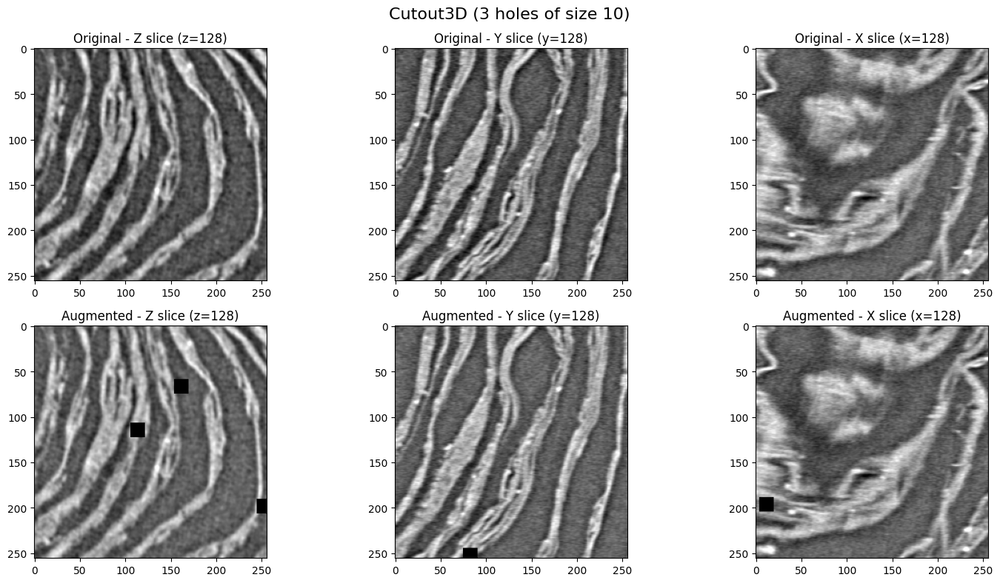

In [13]:
# Cutout 3D
volume_tensor = torch.from_numpy(volume).float()
aug = Cutout3D(
    volume=volume_tensor,
    n_holes=20,
    hole_size=150,  
    random_offset=True,
    device=device
)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="Cutout3D (3 holes of size 10)")

## Test Intensity Augmentations

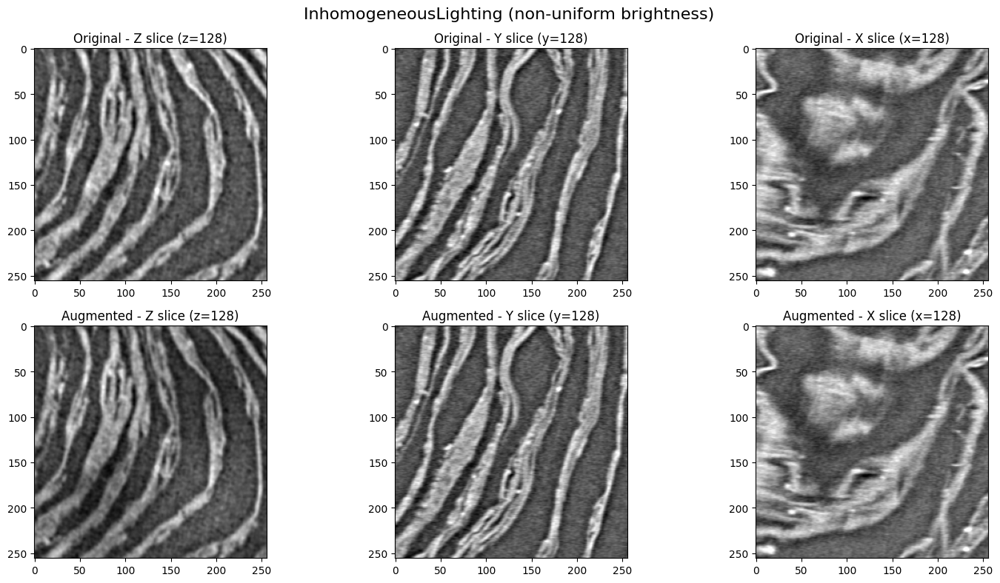

In [15]:
# Inhomogeneous Lighting
volume_tensor = torch.from_numpy(volume).float()
aug = InhomogeneousLighting(
    volume=volume_tensor,
    num_frequencies=10,
    magnitude=0.5,
    device=device
)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="InhomogeneousLighting (non-uniform brightness)")

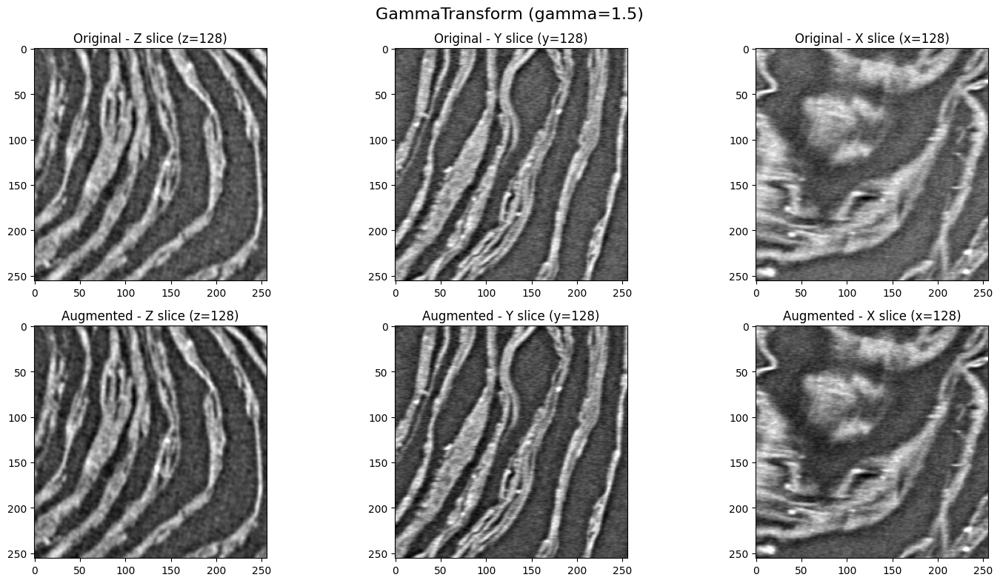

In [16]:
# Gamma Transform
volume_tensor = torch.from_numpy(volume).float()
aug = GammaTransform(volume=volume_tensor, gamma=1.5, device=device)  # Brightens midtones
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="GammaTransform (gamma=1.5)")

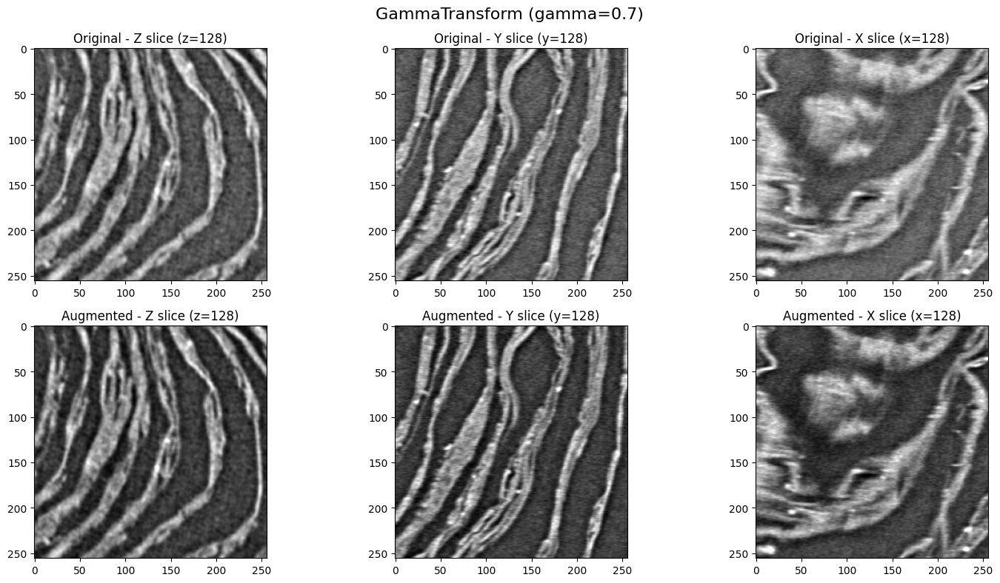

In [17]:
# Gamma Transform (darkening)
volume_tensor = torch.from_numpy(volume).float()
aug = GammaTransform(volume=volume_tensor, gamma=0.7, device=device)  # Darkens midtones
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="GammaTransform (gamma=0.7)")

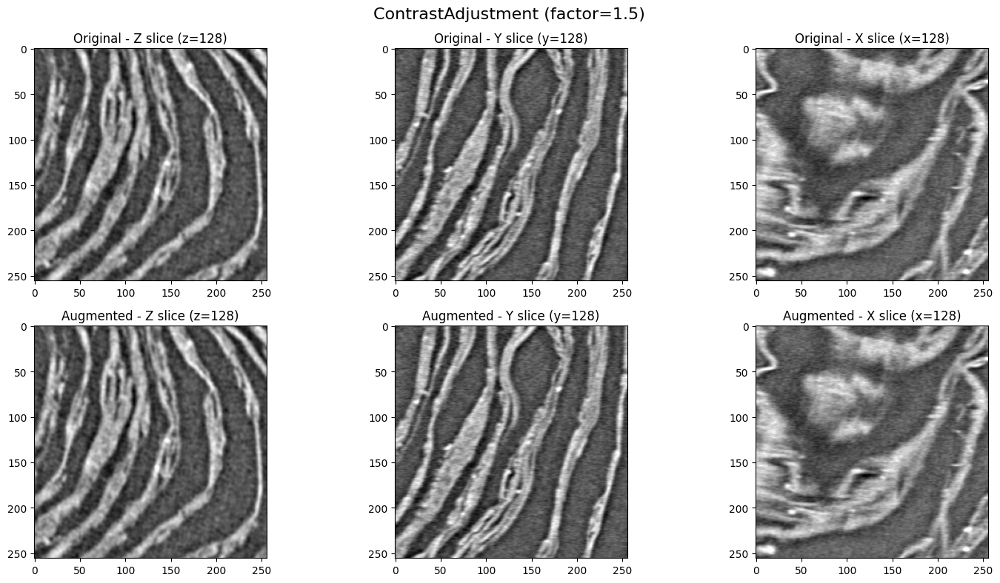

In [18]:
# Contrast Adjustment
volume_tensor = torch.from_numpy(volume).float()
aug = ContrastAdjustment(volume=volume_tensor, factor=1.5, device=device)  # Increase contrast
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="ContrastAdjustment (factor=1.5)")

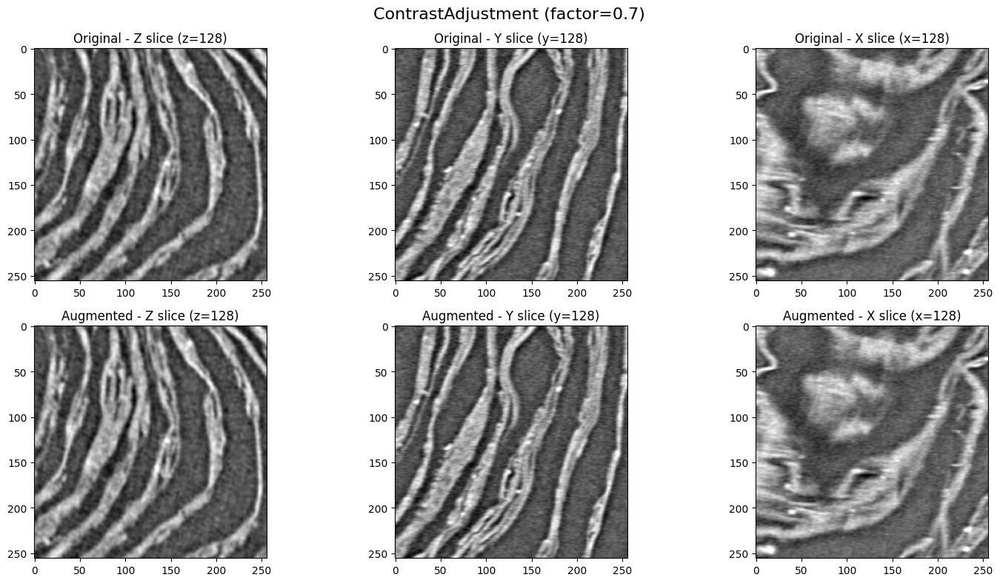

In [19]:
# Contrast Adjustment (decrease)
volume_tensor = torch.from_numpy(volume).float()
aug = ContrastAdjustment(volume=volume_tensor, factor=0.7, device=device)  # Decrease contrast
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="ContrastAdjustment (factor=0.7)")

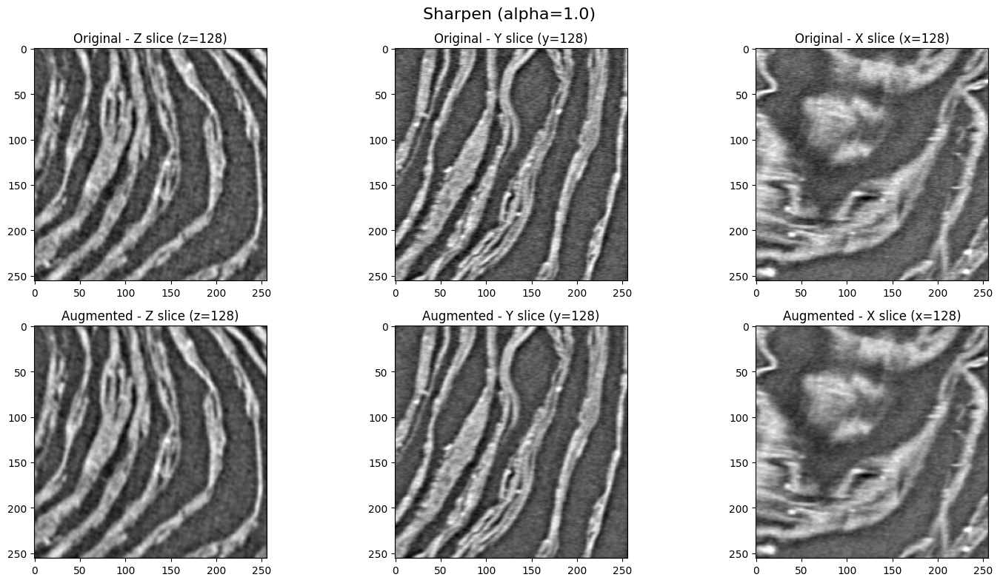

In [20]:
# Sharpen
volume_tensor = torch.from_numpy(volume).float()
aug = Sharpen(volume=volume_tensor, alpha=1.0, per_slice=True, device=device)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="Sharpen (alpha=1.0)")

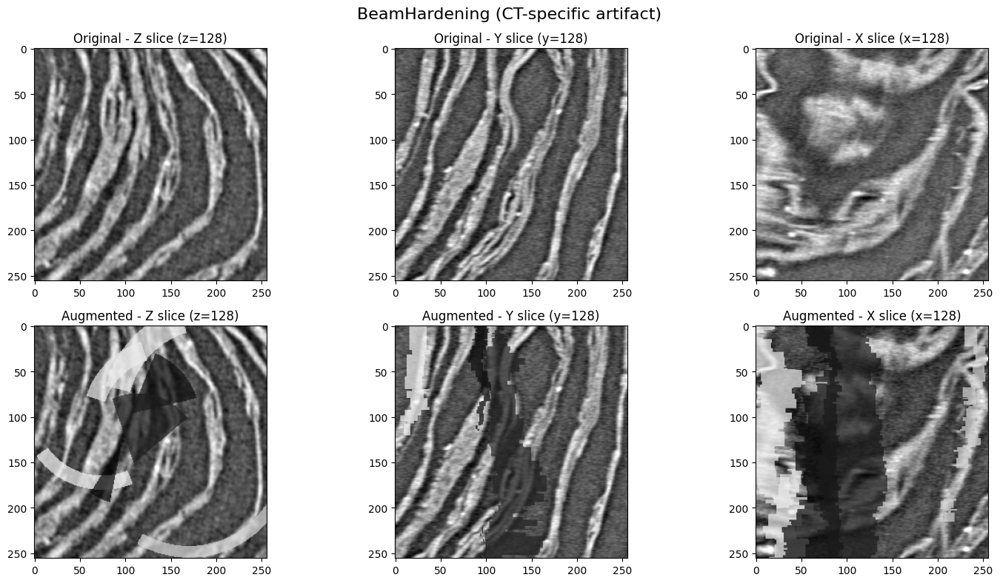

In [ ]:
# Beam Hardening (CT-specific artifact) -- this one is quite bad right now , should use a gaussian -- kind of interesting as just a masking aug though. keeping for now.
volume_tensor = torch.from_numpy(volume).float()
aug = BeamHardening(
    volume=volume_tensor,
    num_crescents=(3, 6),
    intensity_range=(0.2, 0.5),
    z_consistency=0.8,  # High z-consistency
    device=device
)
augmented = aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="BeamHardening (CT-specific artifact)")

## Testing Compose (Multiple Augmentations)

In [ ]:
from augmentation import Compose

# Create a composition of multiple augmentations
volume_tensor = torch.from_numpy(volume).float()

# Define augmentation chain with probabilities
augmentation_chain = [
    (GaussianNoise(std=0.05), 0.8),                        # Add noise
    (RandomRotation(angles=[90, 180, 270]), 0.5),          # 50% chance of rotation
    (RingArtifact(num_rings=(1, 3)), 0.6),                 # CT ring artifacts
    (ContrastAdjustment(factor=(0.8, 1.2)), 0.7)           # Random contrast adjustment
]

# Create compose
composed_aug = Compose(augmentations=augmentation_chain, volume=volume_tensor)
augmented = composed_aug.apply()['volume'].numpy()

visualize_volume_slices(volume, augmented, title="Composed Augmentations Chain")